In [51]:
import numpy as np
from scipy.linalg import fractional_matrix_power
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [52]:
def animate_scatter(data, change_sizes = True, max_size = 5, color = None, **funcAnimation_args):
    fig, ax = plt.subplots()
    sca = plt.scatter(data['positions'][0][:,0], data['positions'][0][:,1], c = color)
    frames = len(data['positions'])
    xmin = np.min(data['positions'])
    xmax = np.max(data['positions'])
    ymin = np.min(data['positions'])
    ymax = np.max(data['positions'])
    def update(frame):
        sca.set_offsets(data['positions'][frame])
        if change_sizes:
            sca.set_sizes(max_size*data['scales'][frame]/np.max(data['scales'][frame]))
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)
        return sca,
    ani = FuncAnimation(fig, update, frames=frames, cache_frame_data = False, blit = True, **funcAnimation_args)
    return HTML(ani.to_jshtml())


In [53]:
def get_circle(res):
    t = np.linspace(0, np.pi*2, res)
    return np.array([[(g :=1j**(h*4/res)).real, g.imag] for h in range(res)], np.float32)
    return np.stack([np.cos(t), np.sin(t)], -1)

In [54]:
N = 40
q = get_circle(N)
color = np.linspace(0, 1, N)

In [55]:
dt = 0.01
ln = np.random.uniform(-1, 1, (N, N))
ln = ln - ln.T
translation = ln*dt + np.eye(N)
duration = 5
H = dict()
H['positions'] = [np.copy(q)]
for g in range(int(duration / dt)):
    q = translation @ q
    H['positions'].append(np.copy(q))

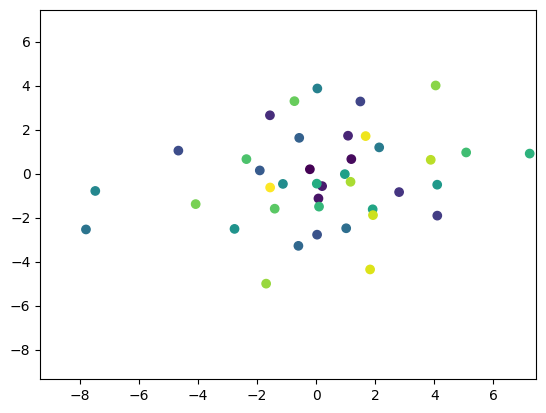

In [56]:
animate_scatter(H, False, color = color)